In [1]:
import numpy as np
import matplotlib.pyplot as plt

# interpolate the square

In [2]:
def interpolating_sqr(x, a):
    
    return(x**(1+a))

In [13]:
x_ = np.linspace(0.001, 2, 1000+1)

y_a1 = interpolating_sqr(x_, a=1)
y_a78 = interpolating_sqr(x_, a=7/8)
y_a34 = interpolating_sqr(x_, a=3/4)
y_a12 = interpolating_sqr(x_, a=1/2)
y_a14 = interpolating_sqr(x_, a=1/4)
y_a18 = interpolating_sqr(x_, a=1/8)
y_a0 = interpolating_sqr(x_, a=0)

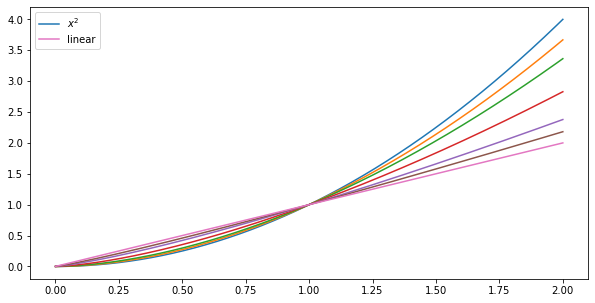

In [14]:
plt.figure(figsize=(10, 5))

plt.plot(x_, y_a1, label='$x^2$')
plt.plot(x_, y_a78)
plt.plot(x_, y_a34)
plt.plot(x_, y_a12)
plt.plot(x_, y_a14)
plt.plot(x_, y_a18)
plt.plot(x_, y_a0, label='linear')
plt.legend()
plt.show();

# interpolate the squareroot

In [15]:
def interpolating_sqrt(x, a):
    
    return(x**(1-a/2))

In [16]:
x_ = np.linspace(0.001, 2, 1000+1)

y_a1 = interpolating_sqrt(x_, a=1)
y_a78 = interpolating_sqrt(x_, a=7/8)
y_a34 = interpolating_sqrt(x_, a=3/4)
y_a12 = interpolating_sqrt(x_, a=1/2)
y_a14 = interpolating_sqrt(x_, a=1/4)
y_a18 = interpolating_sqrt(x_, a=1/8)
y_a0 = interpolating_sqrt(x_, a=0)

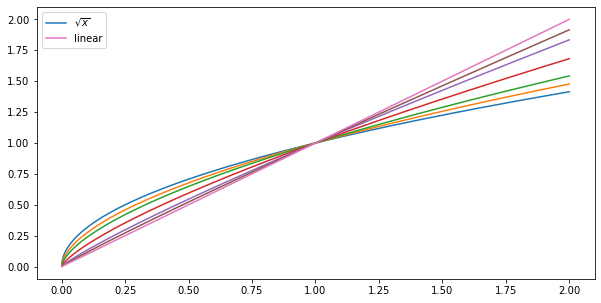

In [19]:
plt.figure(figsize=(10, 5))

plt.plot(x_, y_a1, label='$\sqrt{x}$')
plt.plot(x_, y_a78)
plt.plot(x_, y_a34)
plt.plot(x_, y_a12)
plt.plot(x_, y_a14)
plt.plot(x_, y_a18)
plt.plot(x_, y_a0, label='linear')
plt.legend()
plt.show();

# interpolating the Chi2

In [62]:
from scipy.special import gamma as gamma_func

def chi2_pdf(x, k):
    nom = x**(k/2 - 1) * np.exp(-x/2)
    den = 2**(k/2) * gamma_func(k/2)
    return(nom/den)

def chi2_t_sqrt_pdf(x, k):
    nom = x**(k-1) * np.exp(-x**2/2)
    den = 2**(k/2 - 1) * gamma_func(k/2)
    return(nom/den)

def chi2_pdf_interpolating_sqrt(x, k, d):
    
    c = 2**(k/2) * gamma_func(k/2) 
    der = x**(d) * (1+d)
    r = (0.5 + (1-d)*0.5)/c * interpolating_sqr(x,d)**(k/2 - 1) * np.exp(-interpolating_sqr(x,d)/2) * der
    return(r)

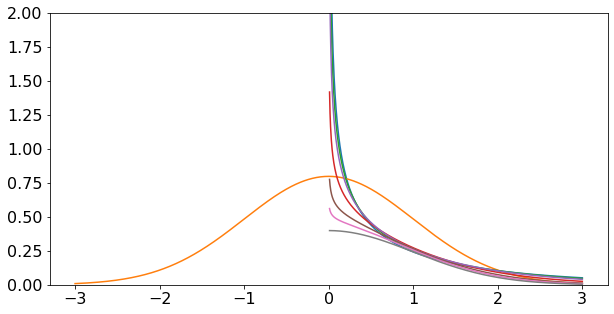

In [63]:
x_P = np.linspace(0.01, 3, 1000+1)
x_R = np.linspace(-3, 3, 1000+1)

k1 = 1
chi2_pdf_ = chi2_pdf(x_P, k1)
chi2_pdf_sqrt = chi2_t_sqrt_pdf(x_R, k1)
chi2_pdf_sqrt_12 = chi2_pdf_interpolating_sqrt(x_P, k1, d=1/2)
chi2_pdf_sqrt_14 = chi2_pdf_interpolating_sqrt(x_P, k1, d=1/4)
chi2_pdf_sqrt_18 = chi2_pdf_interpolating_sqrt(x_P, k1, d=1/8)
chi2_pdf_sqrt_34 = chi2_pdf_interpolating_sqrt(x_P, k1, d=3/4)
chi2_pdf_sqrt_78 = chi2_pdf_interpolating_sqrt(x_P, k1, d=7/8)
chi2_pdf_sqrt_1 = chi2_pdf_interpolating_sqrt(x_P, k1, d=1)

plt.figure(figsize=(10, 5))

plt.plot(x_P, chi2_pdf_)
plt.plot(x_R, chi2_pdf_sqrt)
plt.plot(x_P, chi2_pdf_sqrt_18)
plt.plot(x_P, chi2_pdf_sqrt_12)
plt.plot(x_P, chi2_pdf_sqrt_14)
plt.plot(x_P, chi2_pdf_sqrt_34)
plt.plot(x_P, chi2_pdf_sqrt_78)
plt.plot(x_P, chi2_pdf_sqrt_1)
plt.ylim(0, 2)
plt.show();

# interpolate for real now

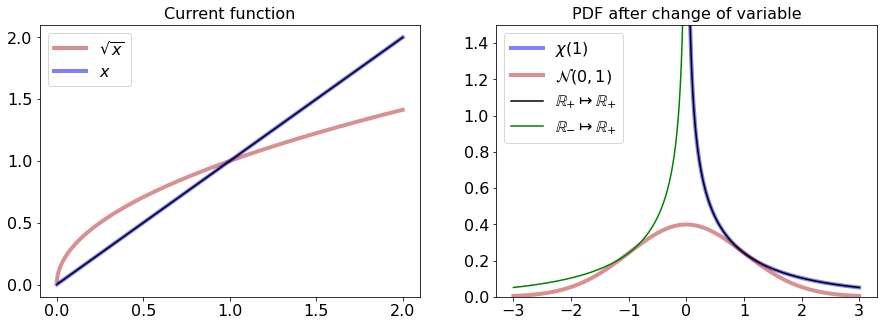

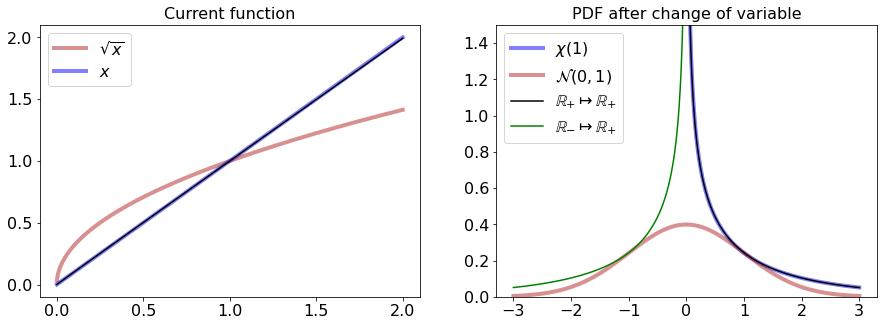

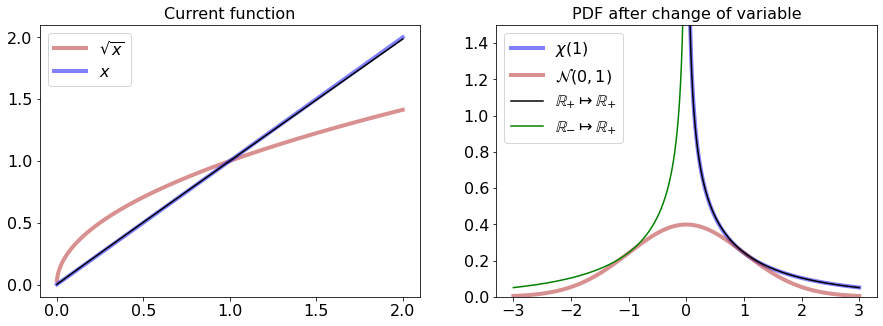

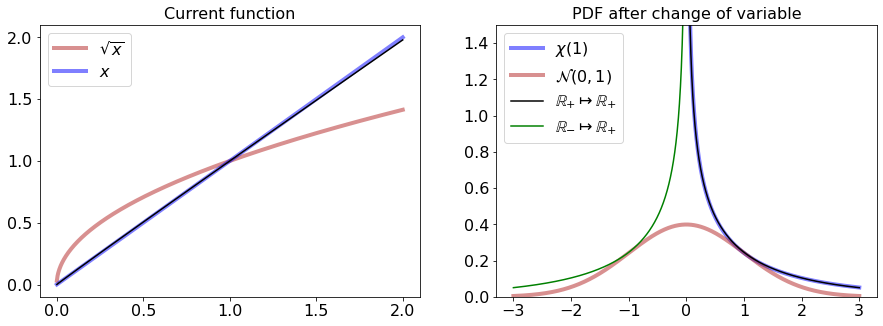

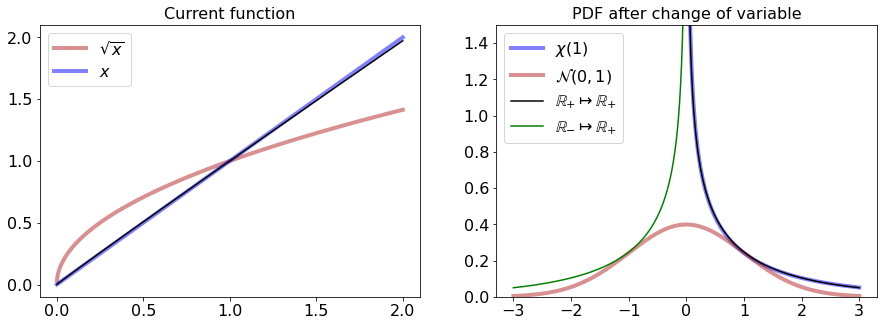

...

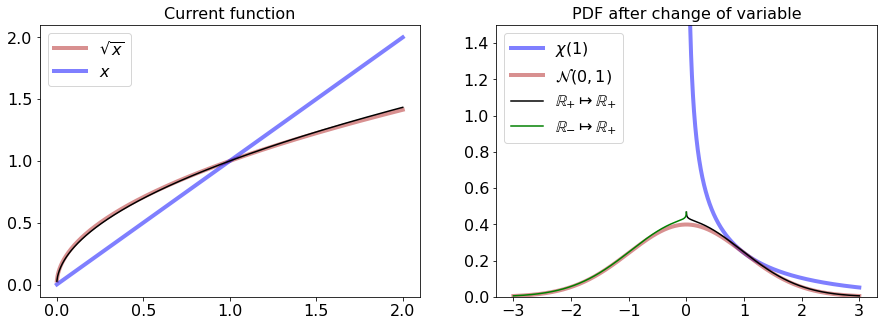

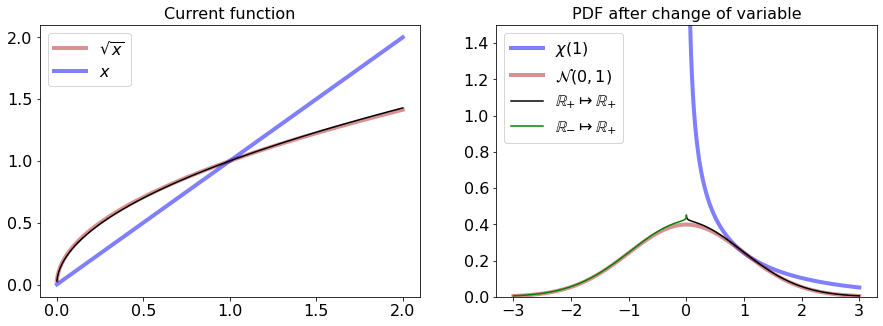

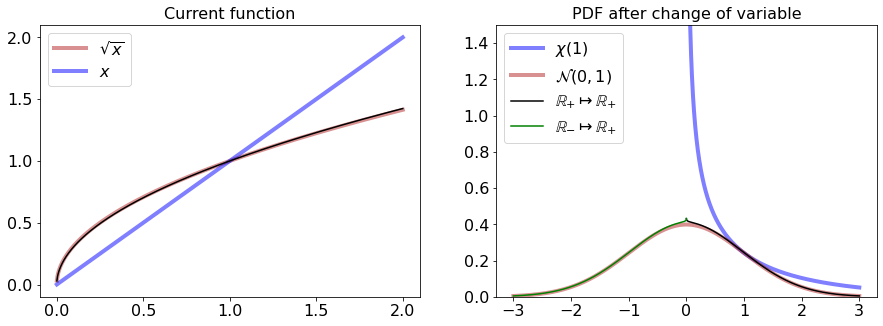

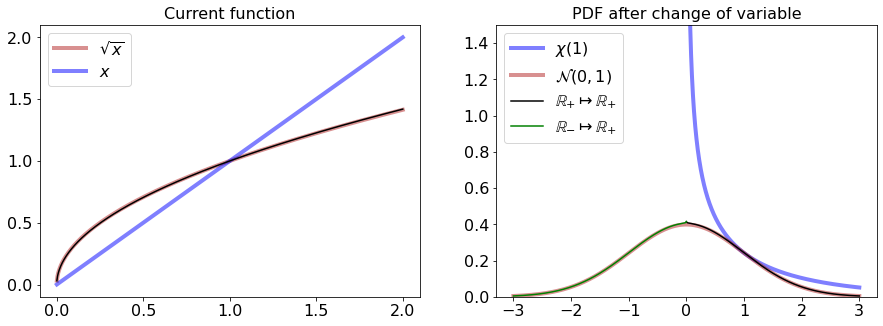

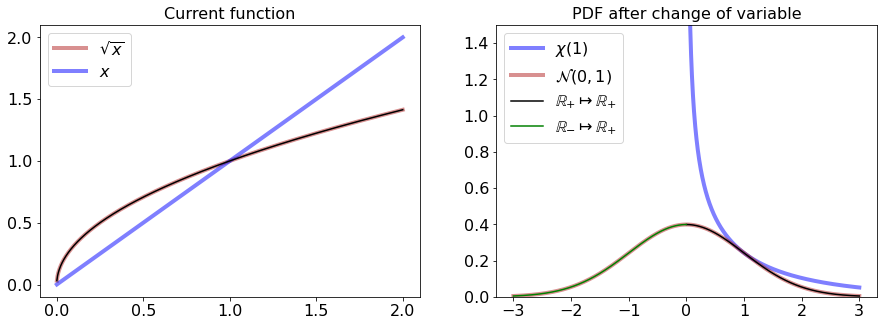

In [81]:
from scipy.stats import norm

x_P = np.linspace(0.001, 3, 1000+1)
x_R = np.linspace(-3, 3, 1000+1)
ds = np.linspace(0, 1, 100+1)
x_N = np.linspace(-3, -0.0001, 1000+1)

chi2_pdf_ = chi2_pdf(x_P, k1)
norm_pdf_ = norm.pdf(x_R, 0, 1)

#plot
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
plt.close()

plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rc('axes', labelsize=16)
legend_size=16
title_size=16

for d_ in ds:
    
    #compute
    y_a1 = interpolating_sqrt(x_, a=d_)
    y_a1_max = interpolating_sqrt(x_, a=0)
    y_a1_min = interpolating_sqrt(x_, a=1)

    chi2_pdf_log_d = chi2_pdf_interpolating_sqrt(x_P, k1, d=d_)
    chi2_pdf_log_d_mirror = chi2_pdf_log_d[::-1]
    
    #plot
    fig, ax = plt.subplots(1, 2, figsize=(15, 5))
    
    ax[0].plot(x_, y_a1_min, lw=4, alpha=0.5, color='firebrick', label='$\sqrt{x}$')
    ax[0].plot(x_, y_a1_max, lw=4, alpha=0.5, color='blue', label='$x$')
    ax[0].plot(x_, y_a1, color='black')
    ax[0].set_title('Current function', size=title_size)
    ax[0].legend(loc='upper left', prop={'size': legend_size})
    
    ax[1].plot(x_P, chi2_pdf_, lw=4, alpha=0.5, color='blue', label=r'$\chi(1)$')
    ax[1].plot(x_R, norm_pdf_, lw=4, alpha=0.5, color='firebrick', label='$\mathcal{N}(0,1)$')
    ax[1].plot(x_P, chi2_pdf_log_d, color='black', label='$\mathbb{R}_{+} \mapsto \mathbb{R}_{+} $')
    ax[1].plot(x_N, chi2_pdf_log_d_mirror, color='green', label='$\mathbb{R}_{-} \mapsto \mathbb{R}_{+} $')
    ax[1].set_title('PDF after change of variable', size=title_size)
    ax[1].legend(loc='upper left', prop={'size': legend_size})
    
    ax[1].set_ylim(0,1.5)
    
    plt.show();

In [82]:
#plot
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
plt.close()

plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rc('axes', labelsize=16)
legend_size=16
title_size=16
plt.close()

def animate_func(i):
    
    d_ = ds[i]
    
    ax[0].cla()
    ax[1].cla()
    
    #compute
    y_a1 = interpolating_sqrt(x_, a=d_)
    y_a1_max = interpolating_sqrt(x_, a=0)
    y_a1_min = interpolating_sqrt(x_, a=1)

    chi2_pdf_log_d = chi2_pdf_interpolating_sqrt(x_P, k1, d=d_)
    chi2_pdf_log_d_mirror = chi2_pdf_log_d[::-1]
    
    #plot
    
    ax[0].plot(x_, y_a1_max, lw=4, alpha=0.5, color='blue', label='$x$')
    ax[0].plot(x_, y_a1_min, lw=4, alpha=0.5, color='firebrick', label='$\sqrt{x}$')
    ax[0].plot(x_, y_a1, color='black')
    ax[0].set_title('Current function', size=title_size)
    ax[0].legend(loc='upper left', prop={'size': legend_size})
    
    ax[1].plot(x_P, chi2_pdf_, lw=4, alpha=0.5, color='blue', label=r'$\chi(1)$')
    ax[1].plot(x_R, norm_pdf_, lw=4, alpha=0.5, color='firebrick', label='$\mathcal{N}(0,1)$')
    ax[1].plot(x_P, chi2_pdf_log_d, color='black', label='$\mathbb{R}_{+} \mapsto \mathbb{R}_{+} $')
    ax[1].plot(x_N, chi2_pdf_log_d_mirror, color='green', label='$\mathbb{R}_{-} \mapsto \mathbb{R}_{+} $')
    ax[1].set_title('PDF after change of variable', size=title_size)
    ax[1].legend(loc='upper left', prop={'size': legend_size})
    
    ax[1].set_ylim(0,1.5)


In [83]:
from matplotlib import animation
from IPython.display import HTML

total_frames=100

# Animation setup
anim = animation.FuncAnimation(
    fig, func=animate_func, frames=total_frames, interval=100, blit=False
)
anim.save('Chi2_Normal_sqrt.gif', dpi=300)
HTML(anim.to_jshtml())